# Bonus Tasks

# Importing Libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import LearningRateScheduler

In [2]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


# Model

In [3]:
def build_unet_model():
    inputs = layers.Input(shape=(256, 256, 1))
    
    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)          # Output size: (128, 128)
    
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)          # Output size: (64, 64)
    
    # Bottleneck
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    
    # Decoder
    u4 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c3)
    u4 = layers.concatenate([u4, c2])
    c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u4)
    c4 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c4)
    
    u5 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c4)
    u5 = layers.concatenate([u5, c1])
    c5 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u5)
    c5 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c5)
    
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid', padding='same')(c5)
    
    model = models.Model(inputs=[inputs], outputs=[outputs])
    
    return model


# Utilities

In [4]:
def custom_accuracy(y_true, y_pred, threshold=0.1):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    diff = tf.abs(y_true - y_pred)
    correct_pixels = tf.less_equal(diff, threshold)
    accuracy = tf.reduce_mean(tf.cast(correct_pixels, tf.float32))
    return accuracy


def lr_scheduler(epoch, lr):
    if epoch < 5:
        return float(lr)
    else:
        new_lr = lr * tf.math.exp(-0.1)
        return float(new_lr.numpy())

    
def train_model(X_train, y_train, X_test, y_test, use_lr_scheduler=False, save_model=False, filter_type="sobel"):
    model = build_unet_model()

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
                  loss='mse',
                  metrics=['mse', 'mae'])

    callbacks = [LearningRateScheduler(lr_scheduler)] if use_lr_scheduler else []

    # Train the model
    history = model.fit(
        X_train, y_train,
        epochs=10,
        batch_size=32,
        validation_data=(X_test, y_test),
        callbacks=callbacks
    )
    
    if save_model:
        # Save the model
        model_name = f"{filter_type}_filter_model_with_lr.h5" if use_lr_scheduler else f"{filter_type}_filter_model_without_lr.h5"
        model.save(model_name)

    return model, history


# Evaluate the model
def evaluate_model(model, X_test, y_test):
    _, mse, mae = model.evaluate(X_test, y_test)
    print(f"Test MSE: {mse}")
    print(f"Test MAE: {mae}")

    # Predict and post-process
    y_pred = model.predict(X_test)
    y_pred = np.squeeze(y_pred, axis=-1)

    # Ensure y_test and y_pred are of type float32 and in range [0, 1]
    y_test = tf.clip_by_value(tf.cast(y_test, tf.float32), 0.0, 1.0)
    y_pred = tf.clip_by_value(tf.cast(y_pred, tf.float32), 0.0, 1.0)

    # Calculate custom accuracy
    custom_acc = custom_accuracy(y_test, y_pred, threshold=0.1).numpy()
    print(f"Custom Accuracy: {custom_acc * 100:.2f}%")

    # Compute SSIM
    ssim = tf.image.ssim(y_test, y_pred, max_val=1.0)
    print(f"SSIM (Structural Similarity Index): {tf.reduce_mean(ssim).numpy()}")

    return y_pred


def plot_sample(image, true_sobel, predicted_sobel):
    image = image.numpy().squeeze() if isinstance(image, tf.Tensor) else image.squeeze()
    true_sobel = true_sobel.numpy().squeeze() if isinstance(true_sobel, tf.Tensor) else true_sobel.squeeze()
    predicted_sobel = predicted_sobel.numpy().squeeze() if isinstance(predicted_sobel, tf.Tensor) else predicted_sobel.squeeze()

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image.squeeze(), cmap='gray')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.title("Ground Truth Sobel")
    plt.imshow(true_sobel.squeeze(), cmap='gray')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.title("Predicted Sobel")
    plt.imshow(predicted_sobel.squeeze(), cmap='gray')
    plt.axis('off')
    plt.show()
    

In [5]:
def sobel_filter(image):
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    return np.uint8(sobel)

def laplacian_filter(image):
    return np.uint8(cv2.Laplacian(image, cv2.CV_64F))

# def prewitt_filter(image):
#     kernelx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
#     kernely = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
#     return np.uint8(cv2.filter2D(image, -1, kernelx) + cv2.filter2D(image, -1, kernely))

def prewitt_filter(image):
    kernelx = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    kernely = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    
    prewitt_x = cv2.filter2D(image, cv2.CV_64F, kernelx)
    prewitt_y = cv2.filter2D(image, cv2.CV_64F, kernely)
    
    prewitt = np.sqrt(prewitt_x**2 + prewitt_y**2)  # Magnitude of gradients
    
    # Normalize the result to range [0, 255]
    prewitt = cv2.normalize(prewitt, None, 0, 255, cv2.NORM_MINMAX)
    
    return np.uint8(prewitt)

def apply_filter_to_dataset(dataset, filter_type="sobel"):
    filtered_dataset = []
    if filter_type == "sobel":
        filter_function = sobel_filter
    elif filter_type == "laplacian":
        filter_function = laplacian_filter
    elif filter_type == "prewitt":
        filter_function = prewitt_filter
    else:
        raise ValueError(f"Unknown filter type: {filter_type}")
    
    for image in dataset:
        filtered_image = filter_function(image)
        filtered_dataset.append(filtered_image)
    return np.array(filtered_dataset)


def train_and_evaluate(filter_type, train_dataset, test_dataset, y_train, y_test):
    print(f"Training model on {filter_type}-filtered dataset...")
    model, history = train_model(train_dataset, y_train, test_dataset, y_test, filter_type=filter_type)
    
    print(f"Evaluating model on {filter_type}-filtered test dataset...")
    y_pred = evaluate_model(model, test_dataset, y_test)
    
    for i in range(3):
        idx = np.random.randint(0, len(test_dataset))
        plot_sample(test_dataset[idx], y_test[idx], y_pred[idx])

    return model, history

# Loading the datasets

In [6]:
# load the data
X_train_og = np.load("/kaggle/input/saved-natural/X_train.npy")
X_test_og = np.load("/kaggle/input/saved-natural/X_test.npy")

# Normalize the images
X_train = X_train_og / 255.0
X_test = X_test_og / 255.0

print(X_train.shape, X_test.shape)

(5519, 256, 256) (1380, 256, 256)


# Applying different filters

In [7]:
# Apply filters to the datasets
sobel_dataset = apply_filter_to_dataset(X_train_og, filter_type="sobel") / 255.0
sobel_test_dataset = apply_filter_to_dataset(X_test_og, filter_type="sobel") / 255.0

laplacian_dataset = apply_filter_to_dataset(X_train_og, filter_type="laplacian") / 255.0
laplacian_test_dataset = apply_filter_to_dataset(X_test_og, filter_type="laplacian") / 255.0

prewitt_dataset = apply_filter_to_dataset(X_train_og, filter_type="prewitt") / 255.0
prewitt_test_dataset = apply_filter_to_dataset(X_test_og, filter_type="prewitt") / 255.0

# Check ranges of the filtered datasets
print("Sobel Dataset - Min:", np.min(sobel_dataset), "Max:", np.max(sobel_dataset))
print("Sobel Test Dataset - Min:", np.min(sobel_test_dataset), "Max:", np.max(sobel_test_dataset))

print("Laplacian Dataset - Min:", np.min(laplacian_dataset), "Max:", np.max(laplacian_dataset))
print("Laplacian Test Dataset - Min:", np.min(laplacian_test_dataset), "Max:", np.max(laplacian_test_dataset))

print("Prewitt Dataset - Min:", np.min(prewitt_dataset), "Max:", np.max(prewitt_dataset))
print("Prewitt Test Dataset - Min:", np.min(prewitt_test_dataset), "Max:", np.max(prewitt_test_dataset))

del X_train_og, X_test_og

Sobel Dataset - Min: 0.0 Max: 1.0
Sobel Test Dataset - Min: 0.0 Max: 1.0
Laplacian Dataset - Min: 0.0 Max: 1.0
Laplacian Test Dataset - Min: 0.0 Max: 1.0
Prewitt Dataset - Min: 0.0 Max: 1.0
Prewitt Test Dataset - Min: 0.0 Max: 1.0


# Sobel Filter Model

Training model on Sobel-filtered dataset...
Epoch 1/10


I0000 00:00:1725564439.418181     106 service.cc:145] XLA service 0x786a48088ed0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725564439.418239     106 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1725564476.552810     106 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


173/173 ━━━━━━━━━━━━━━━━━━━━ 138s 562ms/step - loss: 0.0826 - mae: 0.2322 - mse: 0.0826 - val_loss: 0.0232 - val_mae: 0.0977 - val_mse: 0.0232
Epoch 2/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0190 - mae: 0.0886 - mse: 0.0190 - val_loss: 0.0148 - val_mae: 0.0725 - val_mse: 0.0148
Epoch 3/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0139 - mae: 0.0694 - mse: 0.0139 - val_loss: 0.0129 - val_mae: 0.0655 - val_mse: 0.0129
Epoch 4/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 430ms/step - loss: 0.0119 - mae: 0.0613 - mse: 0.0119 - val_loss: 0.0109 - val_mae: 0.0560 - val_mse: 0.0109
Epoch 5/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 430ms/step - loss: 0.0105 - mae: 0.0551 - mse: 0.0105 - val_loss: 0.0103 - val_mae: 0.0556 - val_mse: 0.0103
Epoch 6/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 430ms/step - loss: 0.0094 - mae: 0.0508 - mse: 0.0094 - val_loss: 0.0090 - val_mae: 0.0479 - val_mse: 0.0090
Epoch 7/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 430ms/step - loss: 0.0087 - mae: 0.0477 - mse: 0

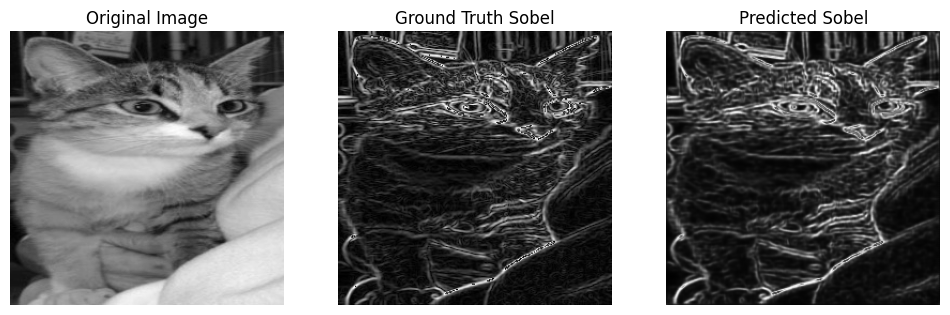

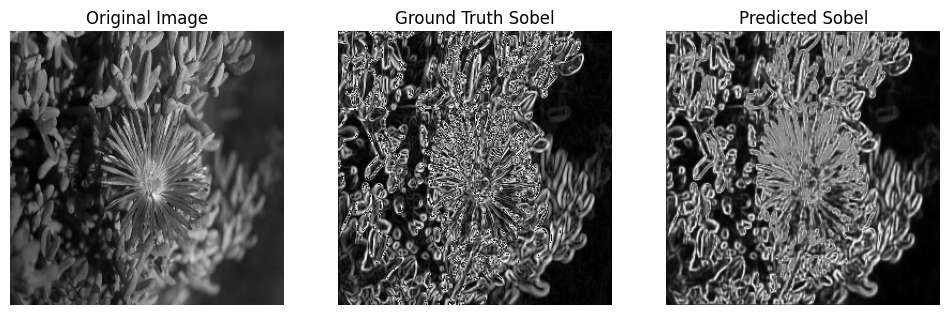

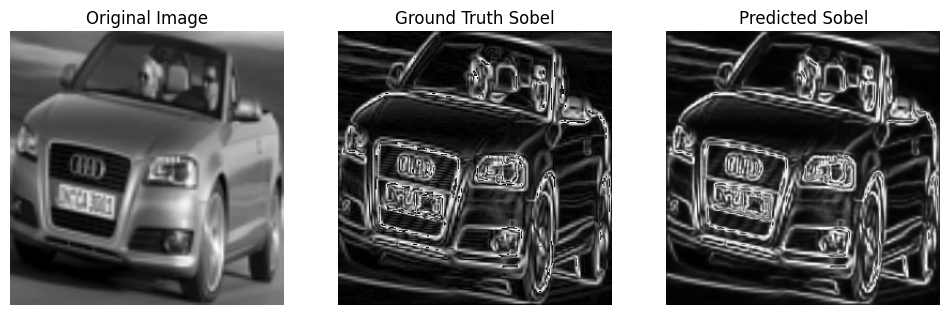

In [8]:
model_sobel, history_sobel = train_and_evaluate("Sobel", X_train, X_test, sobel_dataset, sobel_test_dataset)

# Laplacian Filter Model

Training model on Laplacian-filtered dataset...
Epoch 1/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 83s 452ms/step - loss: 0.2160 - mae: 0.4556 - mse: 0.2160 - val_loss: 0.1901 - val_mae: 0.4110 - val_mse: 0.1901
Epoch 2/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 430ms/step - loss: 0.1842 - mae: 0.3943 - mse: 0.1842 - val_loss: 0.1667 - val_mae: 0.3529 - val_mse: 0.1667
Epoch 3/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 430ms/step - loss: 0.1627 - mae: 0.3515 - mse: 0.1627 - val_loss: 0.1509 - val_mae: 0.3287 - val_mse: 0.1509
Epoch 4/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 431ms/step - loss: 0.1473 - mae: 0.3239 - mse: 0.1473 - val_loss: 0.1361 - val_mae: 0.3076 - val_mse: 0.1361
Epoch 5/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 431ms/step - loss: 0.1331 - mae: 0.2987 - mse: 0.1331 - val_loss: 0.1213 - val_mae: 0.2736 - val_mse: 0.1213
Epoch 6/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 431ms/step - loss: 0.1183 - mae: 0.2723 - mse: 0.1183 - val_loss: 0.1093 - val_mae: 0.2547 - val_mse: 0.1093
Epoch 7/10
173/173 ━━━━━━━━━━━━━━━

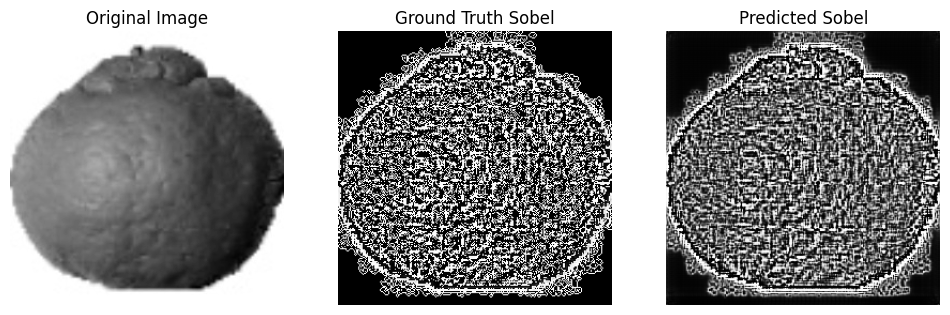

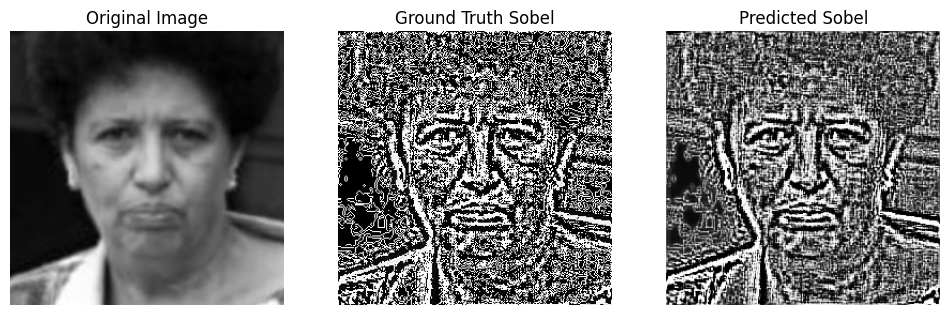

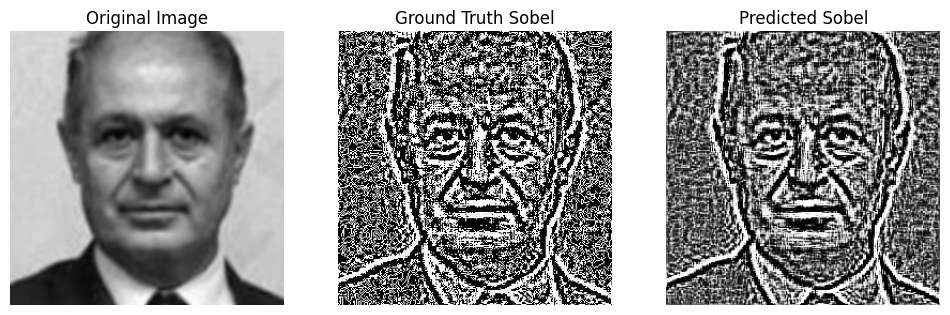

In [9]:
model_laplacian, history_laplacian = train_and_evaluate("Laplacian", X_train, X_test, laplacian_dataset, laplacian_test_dataset)

# Prewitt Filter Model

Training model on Prewitt-filtered dataset...
Epoch 1/10


I0000 00:00:1725568424.713630    1235 service.cc:145] XLA service 0x7e981c08c650 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725568424.713677    1235 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1725568461.887992    1235 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


173/173 ━━━━━━━━━━━━━━━━━━━━ 138s 564ms/step - loss: 0.0715 - mae: 0.1973 - mse: 0.0715 - val_loss: 0.0222 - val_mae: 0.0878 - val_mse: 0.0222
Epoch 2/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0223 - mae: 0.0878 - mse: 0.0223 - val_loss: 0.0222 - val_mae: 0.0878 - val_mse: 0.0222
Epoch 3/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0218 - mae: 0.0865 - mse: 0.0218 - val_loss: 0.0222 - val_mae: 0.0878 - val_mse: 0.0222
Epoch 4/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0220 - mae: 0.0871 - mse: 0.0220 - val_loss: 0.0222 - val_mae: 0.0878 - val_mse: 0.0222
Epoch 5/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0221 - mae: 0.0870 - mse: 0.0221 - val_loss: 0.0222 - val_mae: 0.0878 - val_mse: 0.0222
Epoch 6/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0221 - mae: 0.0874 - mse: 0.0221 - val_loss: 0.0222 - val_mae: 0.0878 - val_mse: 0.0222
Epoch 7/10
173/173 ━━━━━━━━━━━━━━━━━━━━ 74s 429ms/step - loss: 0.0217 - mae: 0.0862 - mse: 0

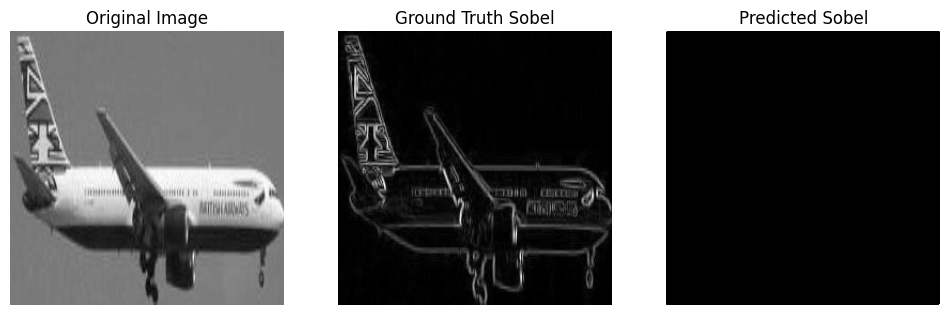

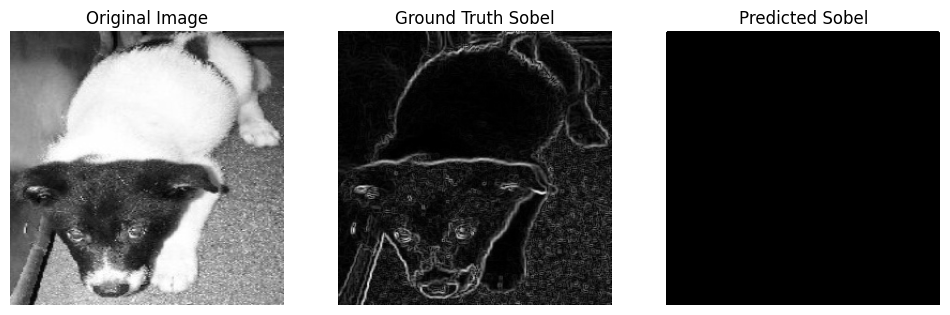

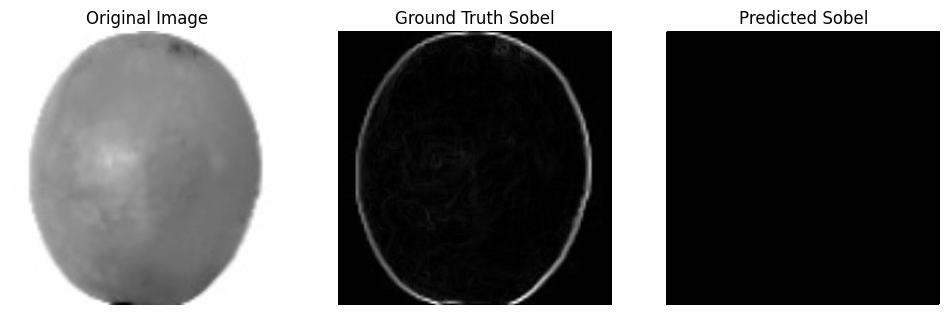

In [8]:
model_prewitt, history_prewitt = train_and_evaluate("Prewitt", X_train, X_test, prewitt_dataset, prewitt_test_dataset)

# Comparison

The U-Net model performed well across Sobel and Laplacian-filtered datasets, demonstrating robust edge detection and feature extraction capabilities. The Prewitt-filtered dataset, however, showed lower performance metrics and SSIM, which highlights the need for further exploration.

# Visualize CNN Layer Representations

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


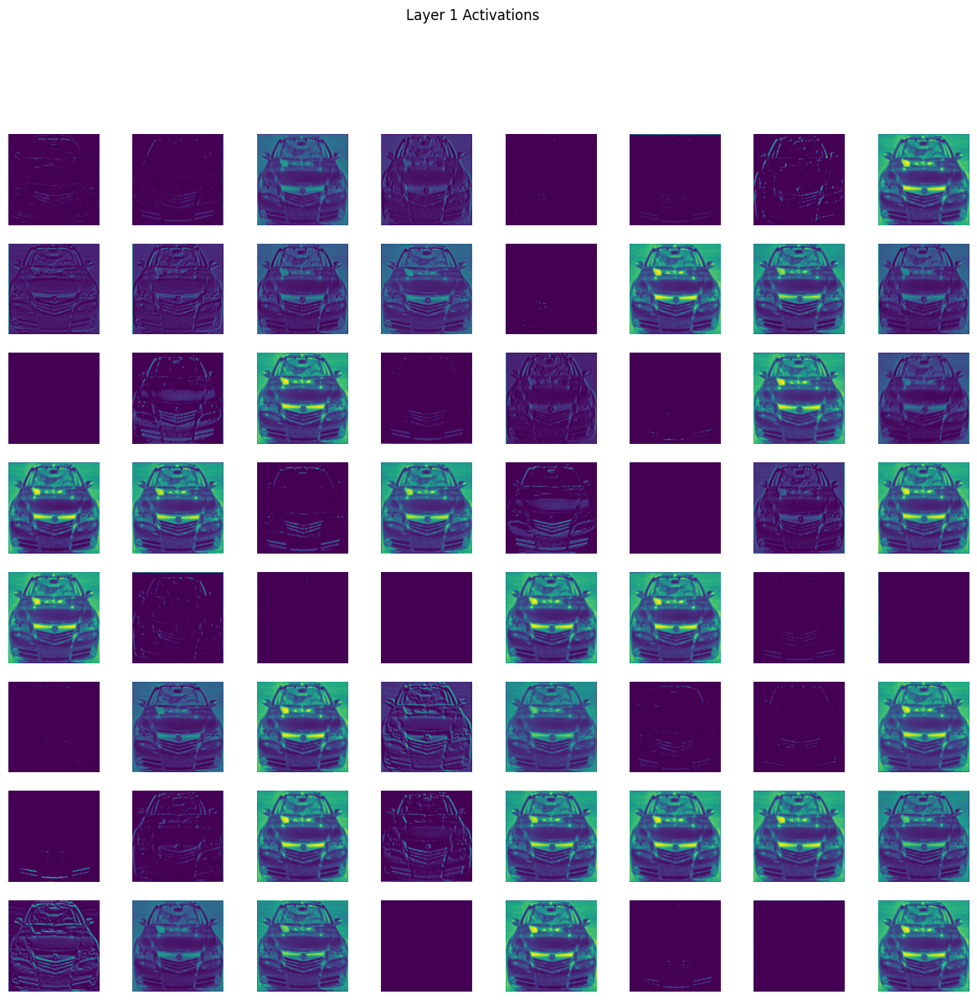

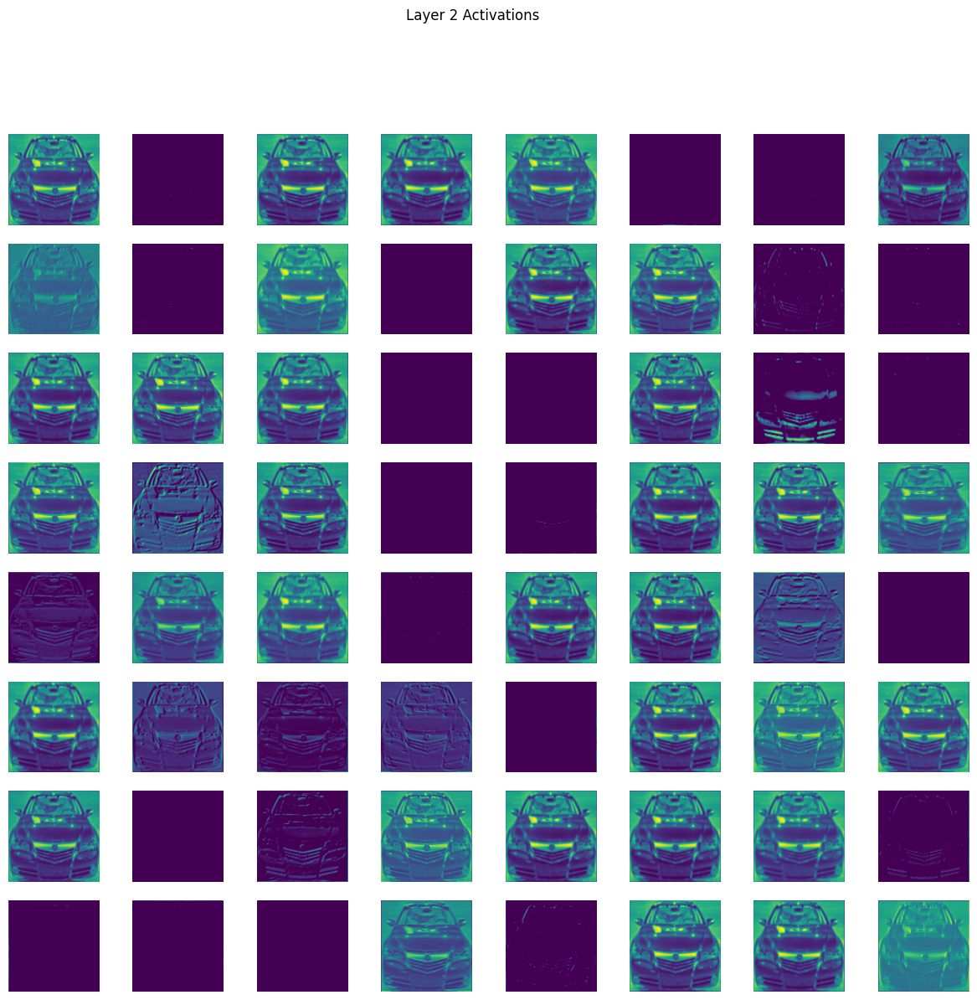

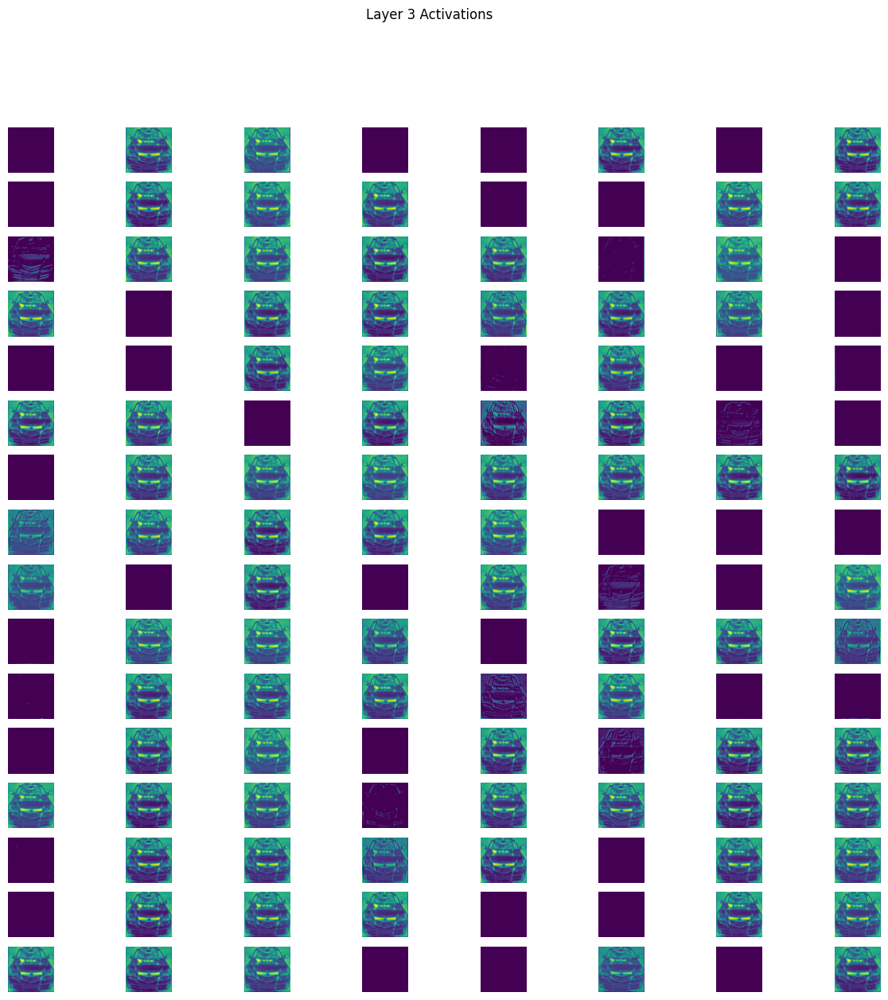

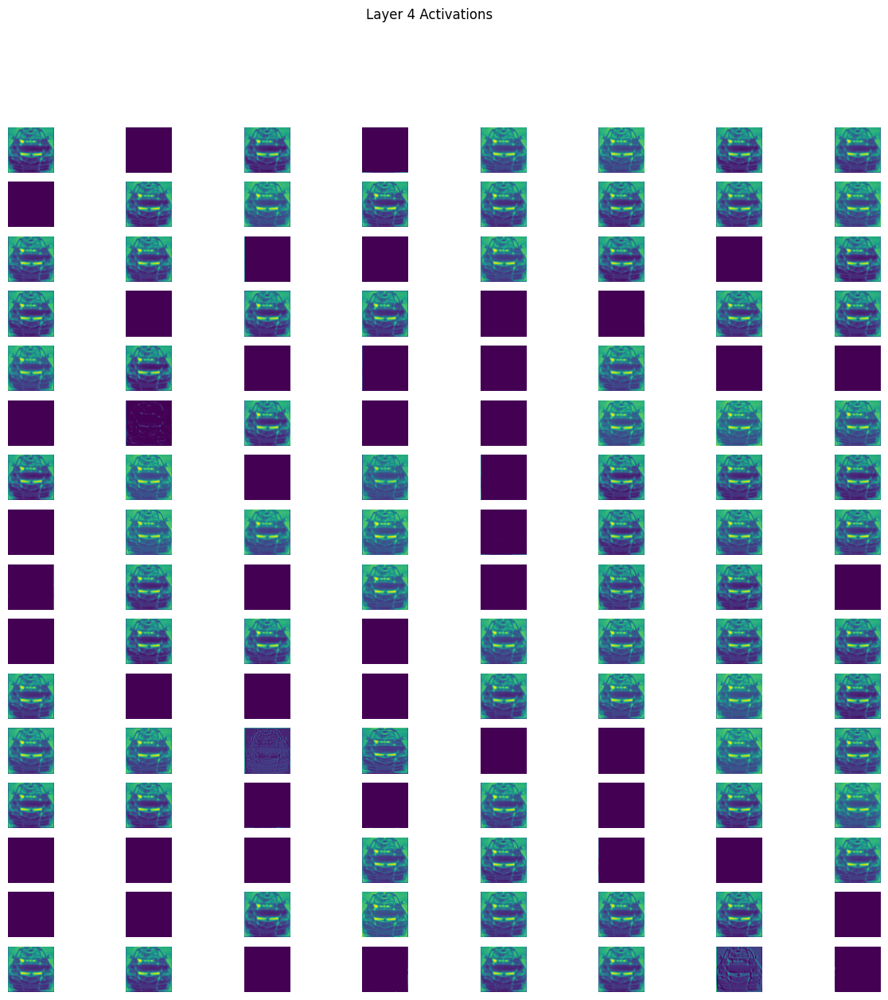

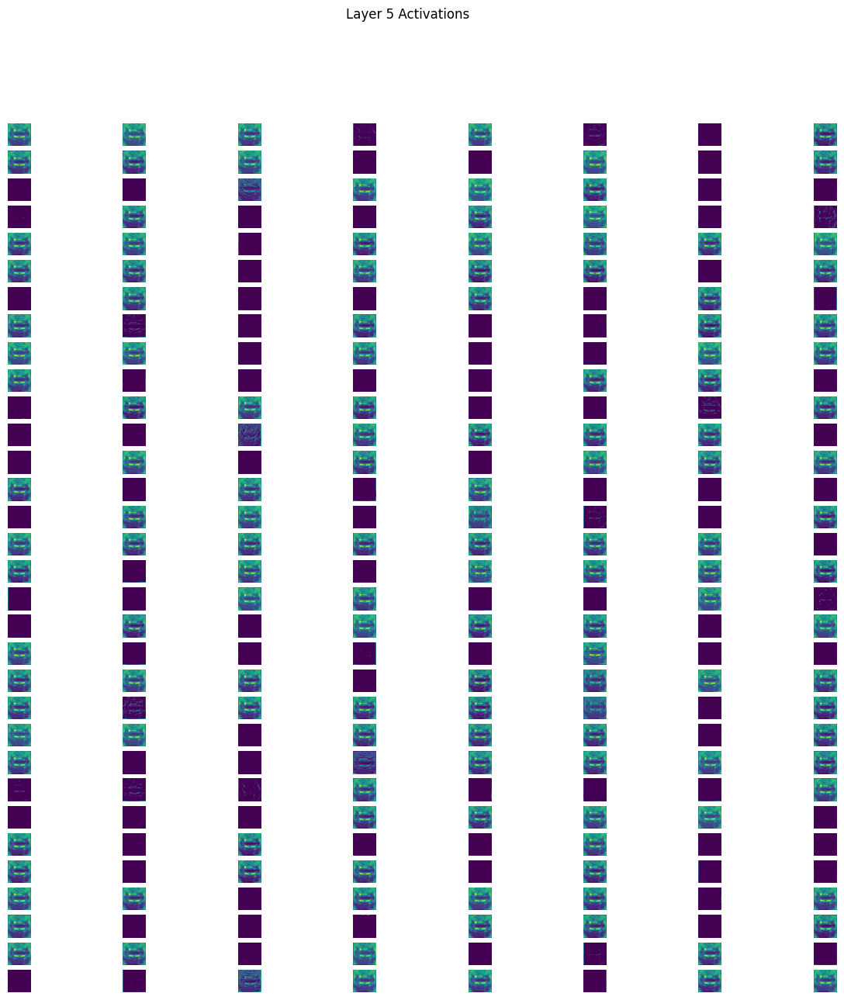

...

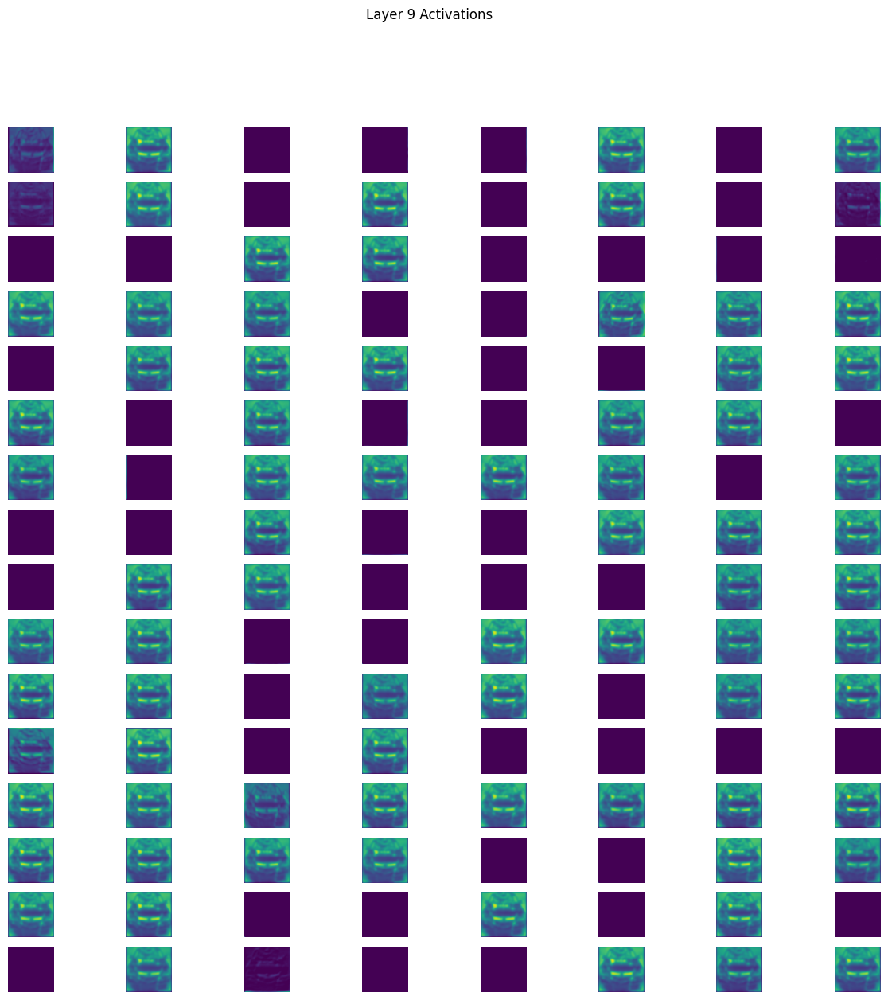

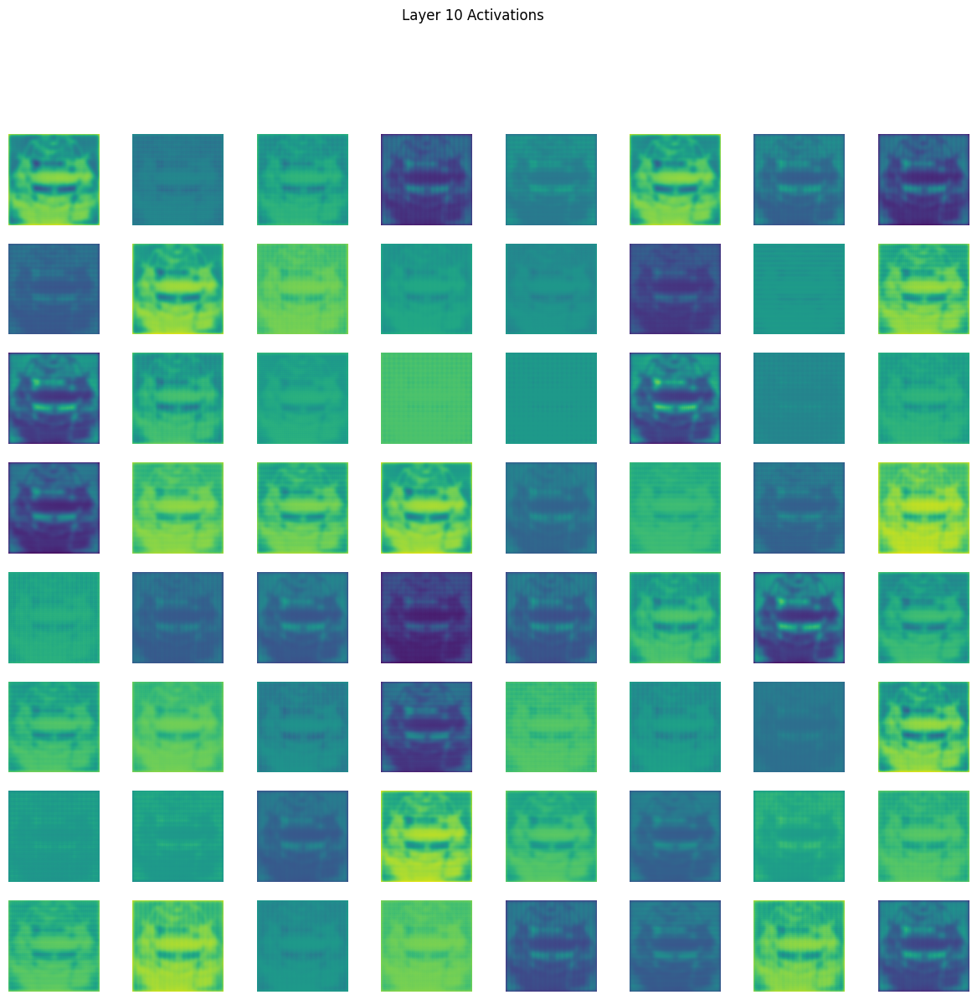

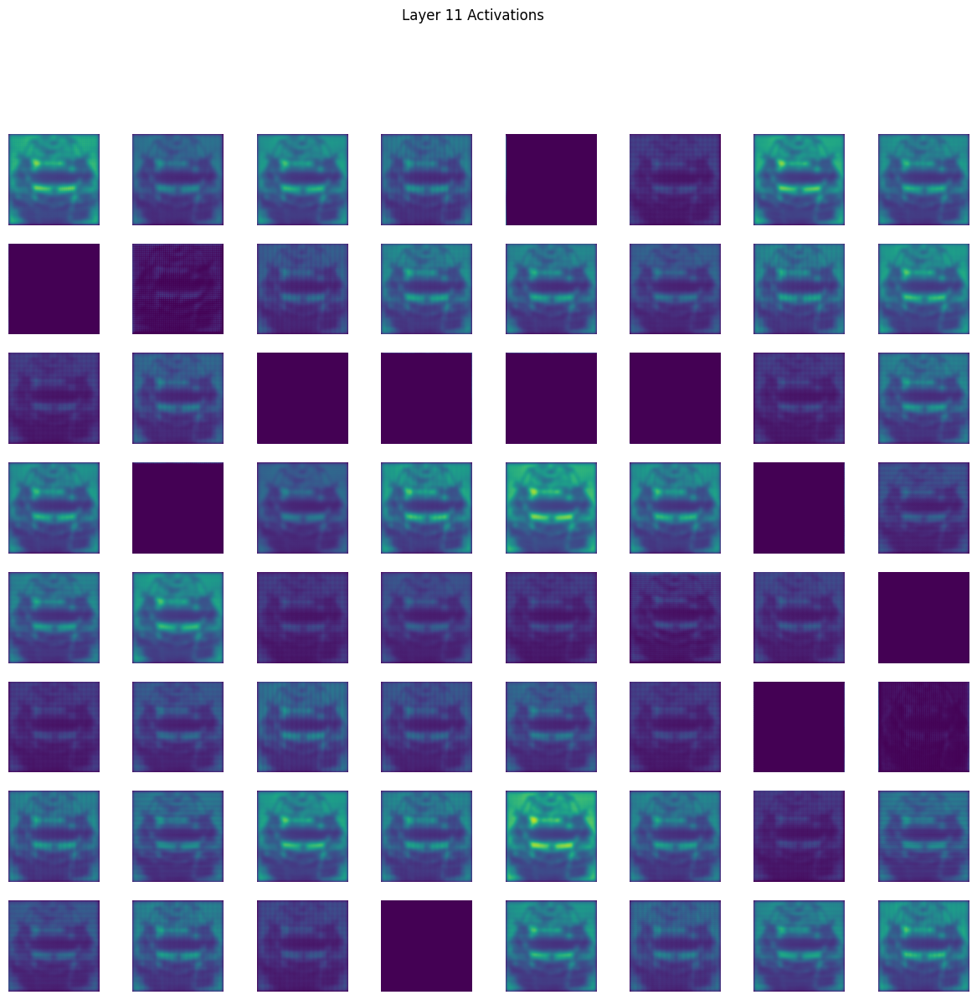

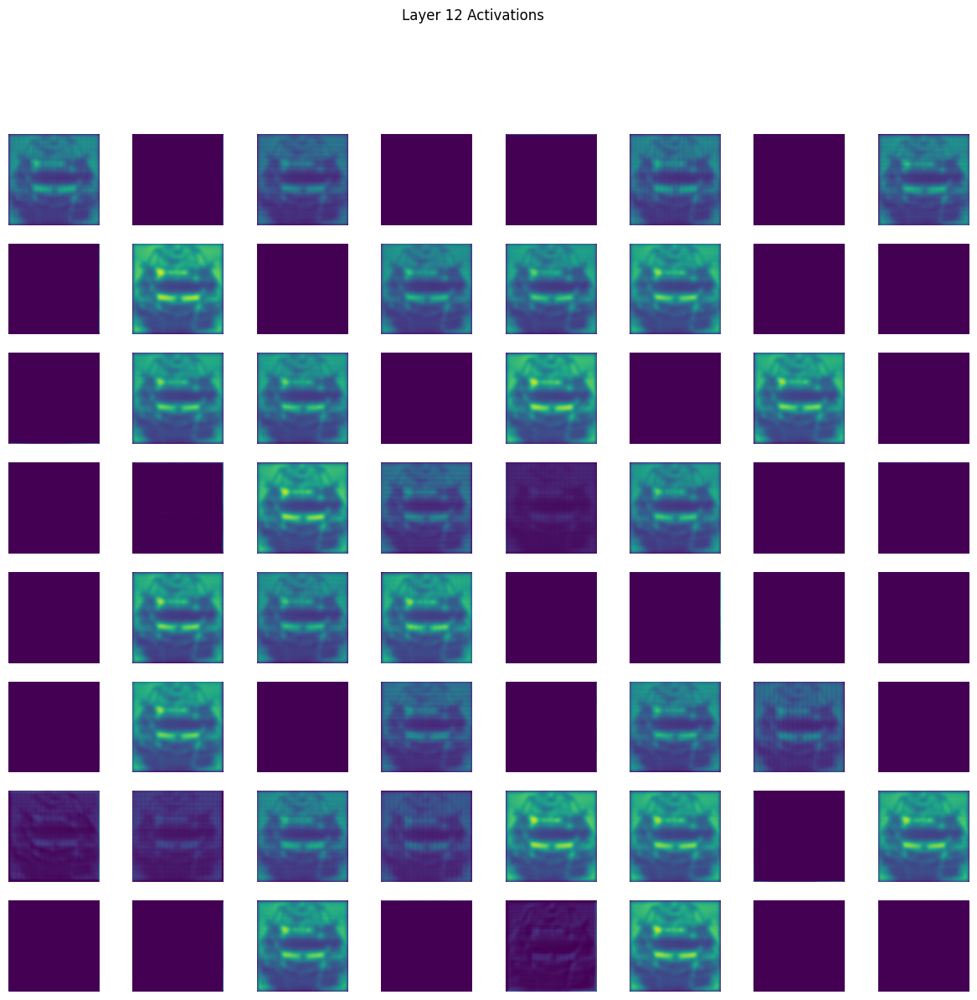

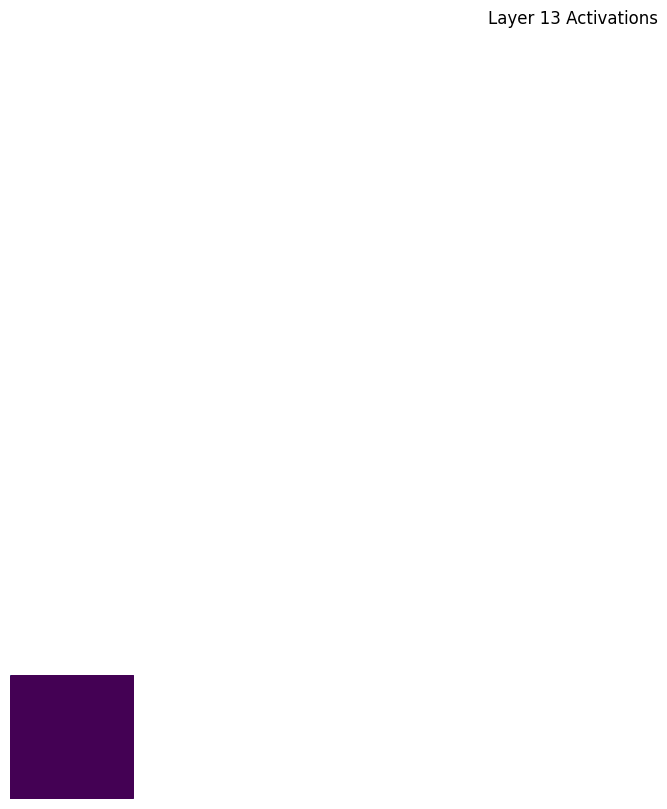

In [11]:
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

def visualize_cnn_layers(model, image):
    layer_outputs = [layer.output for layer in model.layers if 'conv' in layer.name]
    activation_model = Model(inputs=model.input, outputs=layer_outputs)
    
    activations = activation_model.predict(np.expand_dims(image, axis=0))
    
    for i, activation in enumerate(activations):
        plt.figure(figsize=(15, 15))
        n_filters = activation.shape[-1]
        for j in range(n_filters):
            plt.subplot(n_filters//8 + 1, 8, j+1)
            plt.imshow(activation[0, :, :, j], cmap='viridis')
            plt.axis('off')
        plt.suptitle(f'Layer {i+1} Activations')
        plt.show()

visualize_cnn_layers(model_prewitt, X_test[0])
